In [1]:
from google.colab import drive
import os
import zipfile

### mount Google Drive
drive.mount('/content/drive')

### configuration
### PLEASE UPDATE THIS PATH if your file is in a different folder
zip_file_path = '/content/drive/My Drive/gan-getting-started.zip'
extract_path = '/content/dataset'
# ---------------------

### check if the zip file exists
if not os.path.exists(zip_file_path):
    print(f"Error: Zip file not found at {zip_file_path}")
    print("Please make sure the path is correct and the file is in your Google Drive.")
else:
    ### create a directory to extract the data
    os.makedirs(extract_path, exist_ok=True)

    ### unzip the file
    print(f"Locating zip file at: {zip_file_path}")
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        print("Starting to unzip... (this may take a few moments)")
        zip_ref.extractall(extract_path)
        print("Successfully unzipped the dataset.")

    ### list the contents of the extracted folder
    print("\nContents of the dataset directory:")
    !ls -l {extract_path}

Mounted at /content/drive
Locating zip file at: /content/drive/My Drive/gan-getting-started.zip
Starting to unzip... (this may take a few moments)
Successfully unzipped the dataset.

Contents of the dataset directory:
total 280
drwxr-xr-x 2 root root  12288 Oct 29 15:08 monet_jpg
drwxr-xr-x 2 root root   4096 Oct 29 15:08 monet_tfrec
drwxr-xr-x 2 root root 266240 Oct 29 15:08 photo_jpg
drwxr-xr-x 2 root root   4096 Oct 29 15:08 photo_tfrec


## Step 1: Project Overview and Data Description

### Project Goal
The primary objective of this project is to build and train a Generative Adversarial Network (GAN). The specific task is **unpaired image-to-image translation**. We will train this model to learn the artistic style of Claude Monet from a provided dataset of his paintings. We will then use the trained model to apply this style to a separate dataset of real-world photographs.

### Data Description
The dataset, which we have unzipped into the `/content/dataset` directory, consists of four sub-folders:

- **`monet_tfrec`**: This directory contains 300 Monet paintings in the TFRecord format. This will be our **training data** for teaching the model the "Monet style."
- **`photo_tfrec`**: This directory contains 7,028 photographs in the TFRecord format. This will be our **input data**; we will transform these photos using our trained model.
- **`monet_jpg`**: This contains the same 300 Monet paintings as JPEG files. We will use these for visualization during the Exploratory Data Analysis (EDA).
- **`photo_jpg`**: This contains the same 7,028 photographs as JPEG files, which we will also use for visualization.

All images are pre-processed to a 256x256 pixel resolution. Following the competition guidelines, we will use the `_tfrec` (TFRecord) files for efficient model training and the `_jpg` files for visual inspection.

## Step 2: Exploratory Data Analysis (EDA)

The goal in this EDA is to visually and quantitatively compare the 'Monet' and 'Photo' datasets. This will help us understand the transformation our Generative Adversarial Network (GAN) will need to learn.

The EDA will proceed as follows:
1.  **Qualitative Analysis:** We will load and display a grid of sample images from both the `monet_jpg` and `photo_jpg` directories. This will give us an immediate visual sense of the color palettes, textures, and common subjects.
2.  **Quantitative Analysis:** We will analyze the color distributions of each dataset by plotting the average color channel (Red, Green, Blue) histograms for a large sample of images from each set.
3.  **Data Cleaning & Analysis Plan:** We will conclude with a summary of our findings. Since the data is provided in a clean, 256x256 format, we do not anticipate data cleaning. Our EDA will primarily confirm the visual domain gap and that no further pre-processing is necessary.

### EDA Part 1: Visualizing Sample Images

We will begin by loading the file paths for the `.jpg` images and displaying a 4x4 grid of random samples from both the Monet and Photo datasets. This provides a direct visual comparison.

In [ ]:
### install clean-fid
!pip install clean-fid -q
print("clean-fid installed.")

Total Monet JPG images: 300
Total Photo JPG images: 7038


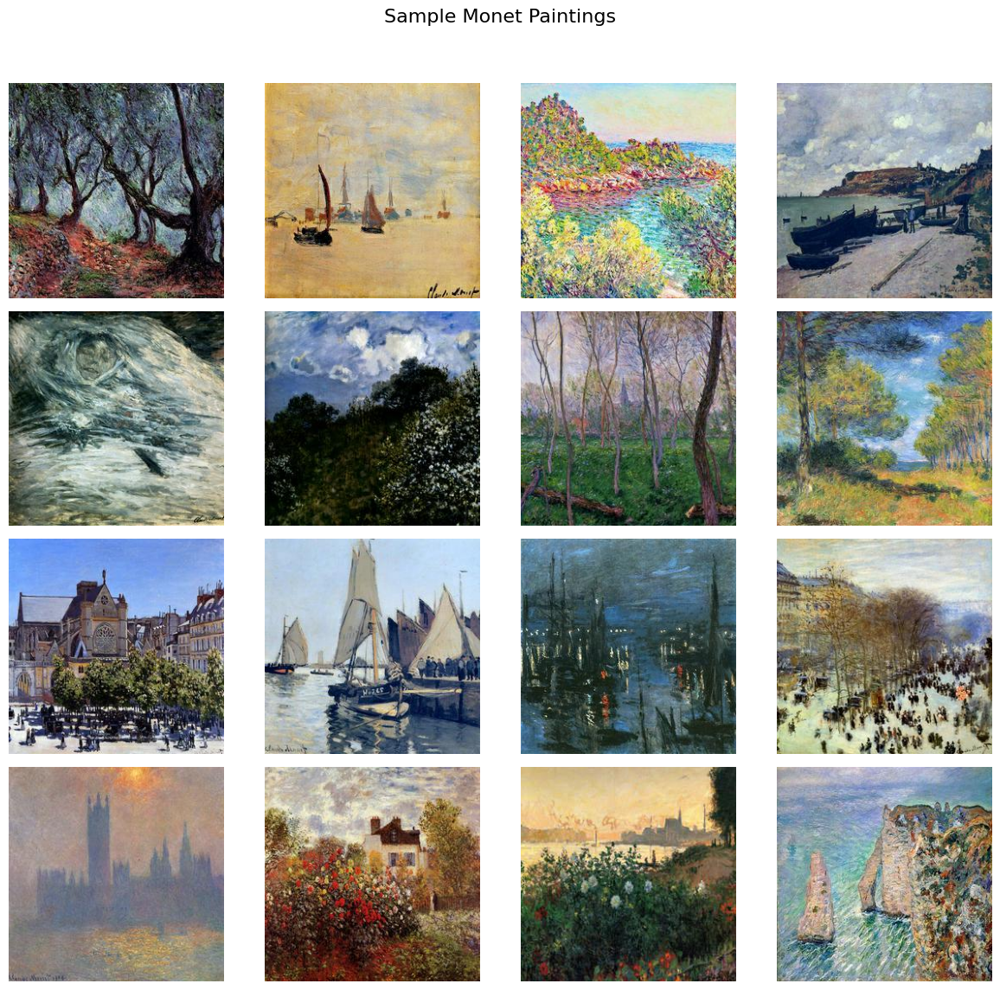

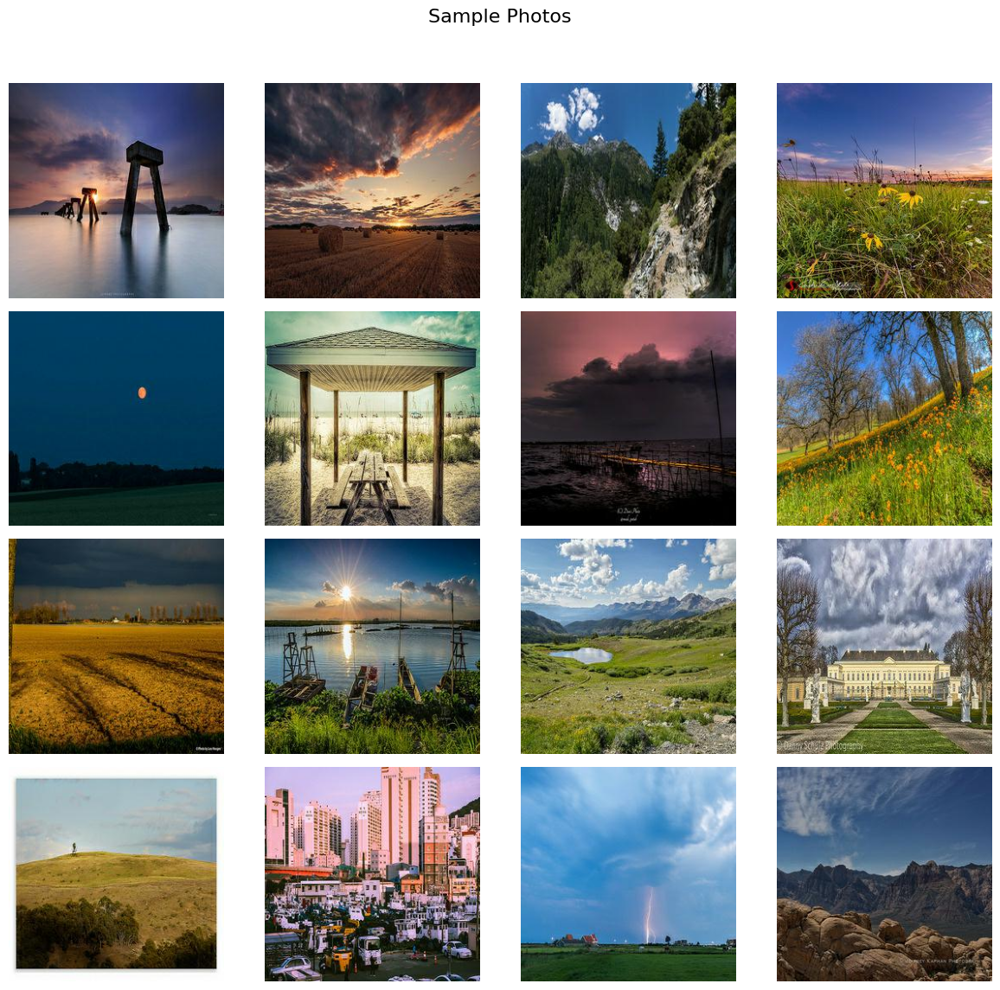

In [2]:
from cleanfid import fid
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import os
import cv2
import numpy as np
import tensorflow as tf
import keras
import time
from keras import layers
import random
import shutil
from google.colab import files
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from tensorflow.keras.applications.efficientnet import preprocess_input
from sklearn.manifold import TSNE
from tqdm import tqdm
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

### define the paths to the JPG directories
MONET_JPG_PATH = '/content/dataset/monet_jpg'
PHOTO_JPG_PATH = '/content/dataset/photo_jpg'

### load the file paths
monet_files = [os.path.join(MONET_JPG_PATH, f) for f in os.listdir(MONET_JPG_PATH)]
photo_files = [os.path.join(PHOTO_JPG_PATH, f) for f in os.listdir(PHOTO_JPG_PATH)]

print(f"Total Monet JPG images: {len(monet_files)}")
print(f"Total Photo JPG images: {len(photo_files)}")

### function to display a grid of images
def display_image_grid(image_paths, title, rows=4, cols=4):
    """Displays a grid of images from the given paths."""
    plt.figure(figsize=(12, 12))
    plt.suptitle(title, fontsize=16)

    ### get random images
    random_indices = np.random.choice(len(image_paths), size=rows*cols, replace=False)

    for i, idx in enumerate(random_indices):
        plt.subplot(rows, cols, i + 1)
        image = Image.open(image_paths[idx])
        plt.imshow(image)
        plt.axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

### display Monet images
display_image_grid(monet_files, "Sample Monet Paintings")

### display photo images
display_image_grid(photo_files, "Sample Photos")

### EDA Part 2: Quantitative Color Analysis (Metrics & Histograms)

To quantify the color differences, we will perform two actions:

1.  **Calculate Descriptive Statistics:** We will load a sample of images and compute the **mean**, **median**, and **standard deviation** for the Red, Green, and Blue color channels. This provides a precise numerical comparison of the color palettes.
2.  **Plot Histograms:** We will plot histograms of the average color channel intensities. This will visually confirm the findings from our statistical table and show the full distribution of colors in each dataset.

Color analysis complete. Calculating statistics...

--- Color Channel Statistics (Mean / Median / Std. Dev.) ---
Dataset    | Channel | Mean       | Median     | Std. Dev. 
------------------------------------------------------------
Monet      | Red     | 132.96     | 133.23     | 28.71     
Monet      | Green   | 133.73     | 134.02     | 28.95     
Monet      | Blue    | 121.57     | 122.73     | 36.06     
------------------------------------------------------------
Photo      | Red     | 99.25      | 98.49      | 31.33     
Photo      | Green   | 100.36     | 98.91      | 31.48     
Photo      | Blue    | 94.75      | 92.44      | 35.90     

Generating histograms...


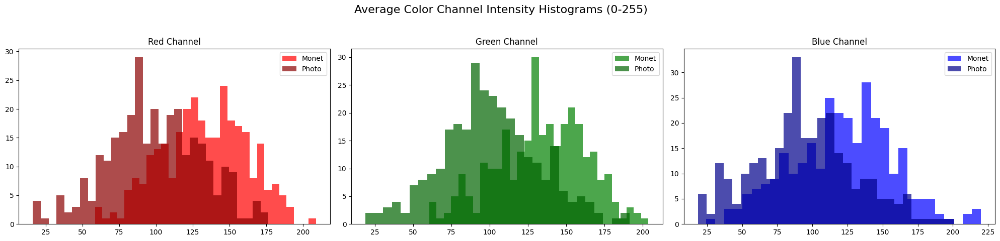

In [3]:
def get_color_channel_means(image_paths, sample_size=300):
    """
    Calculates the mean R, G, B values for a sample of images.
    Returns three lists: one for each channel's mean values.
    """
    r_means, g_means, b_means = [], [], []

    ### ensure sample_size is not larger than available images
    sample_size = min(len(image_paths), sample_size)
    image_sample = np.random.choice(image_paths, sample_size, replace=False)

    for img_path in image_sample:
        ### read image using OpenCV (loads as BGR by default)
        img = cv2.imread(img_path)
        if img is None:
            print(f"Warning: Could not read image {img_path}. Skipping.")
            continue

        ### convert to RGB
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        ### calc mean for each channel
        r_means.append(np.mean(img[:, :, 0]))
        g_means.append(np.mean(img[:, :, 1]))
        b_means.append(np.mean(img[:, :, 2]))

    return r_means, g_means, b_means

### calc channel means
monet_r, monet_g, monet_b = get_color_channel_means(monet_files, sample_size=300)
photo_r, photo_g, photo_b = get_color_channel_means(photo_files, sample_size=300)

print("Color analysis complete. Calculating statistics...")

### calc and print descriptive statistics
stats = {
    'Monet': {
        'Red': (np.mean(monet_r), np.median(monet_r), np.std(monet_r)),
        'Green': (np.mean(monet_g), np.median(monet_g), np.std(monet_g)),
        'Blue': (np.mean(monet_b), np.median(monet_b), np.std(monet_b)),
    },
    'Photo': {
        'Red': (np.mean(photo_r), np.median(photo_r), np.std(photo_r)),
        'Green': (np.mean(photo_g), np.median(photo_g), np.std(photo_g)),
        'Blue': (np.mean(photo_b), np.median(photo_b), np.std(photo_b)),
    }
}

print("\n" + "="*60)
print("--- Color Channel Statistics (Mean / Median / Std. Dev.) ---")
print(f"{'Dataset':<10} | {'Channel':<7} | {'Mean':<10} | {'Median':<10} | {'Std. Dev.':<10}")
print("-"*60)

for dataset_name, channels in stats.items():
    for channel_name, values in channels.items():
        mean, median, std = values
        print(f"{dataset_name:<10} | {channel_name:<7} | {mean:<10.2f} | {median:<10.2f} | {std:<10.2f}")
    if dataset_name == 'Monet':
        print("-"*60)
print("="*60 + "\n")


### plot the histograms
print("Generating histograms...")
fig, axes = plt.subplots(1, 3, figsize=(20, 5))
fig.suptitle('Average Color Channel Intensity Histograms (0-255)', fontsize=16)

### red channel
axes[0].hist(monet_r, bins=30, alpha=0.7, label='Monet', color='red')
axes[0].hist(photo_r, bins=30, alpha=0.7, label='Photo', color='darkred')
axes[0].set_title('Red Channel')
axes[0].legend()

### green channel
axes[1].hist(monet_g, bins=30, alpha=0.7, label='Monet', color='green')
axes[1].hist(photo_g, bins=30, alpha=0.7, label='Photo', color='darkgreen')
axes[1].set_title('Green Channel')
axes[1].legend()

### blue channel
axes[2].hist(monet_b, bins=30, alpha=0.7, label='Monet', color='blue')
axes[2].hist(photo_b, bins=30, alpha=0.7, label='Photo', color='darkblue')
axes[2].set_title('Blue Channel')
axes[2].legend()

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

### EDA Part 3: Feature-Space Domain Gap Analysis (t-SNE)

Our previous analysis confirmed a domain gap at the pixel-level (color). For a robust academic review, we must also demonstrate this gap at the *feature-level*, which is the space a neural network operates in.

We will use **t-SNE (t-distributed Stochastic Neighbor Embedding)** to visualize this. The process is as follows:

1.  **Load a Pre-trained Model:** We will use `EfficientNetB0` (pre-trained on ImageNet) as a feature extractor. This model already understands high-level image features like textures, shapes, and objects.
2.  **Extract Embeddings:** We will process a sample of our Monet and Photo JPGs through the model and extract the high-dimensional feature vectors (embeddings) from an intermediate layer.
3.  **Project to 2D:** We will use `sklearn.manifold.TSNE` to reduce these high-dimensional vectors to a 2D space, which we can then plot.

If a clear "domain gap" exists, we expect to see two distinct clusters on the resulting scatter plot: one for the Monet images and one for the Photos.

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
Extracting features from 300 images...


100%|██████████| 300/300 [00:39<00:00,  7.63it/s]


Extracting features from 1000 images...


100%|██████████| 1000/1000 [01:22<00:00, 12.14it/s]



Total feature vectors combined: (1300, 1280)
Running t-SNE... (this may take a few minutes)
t-SNE complete.


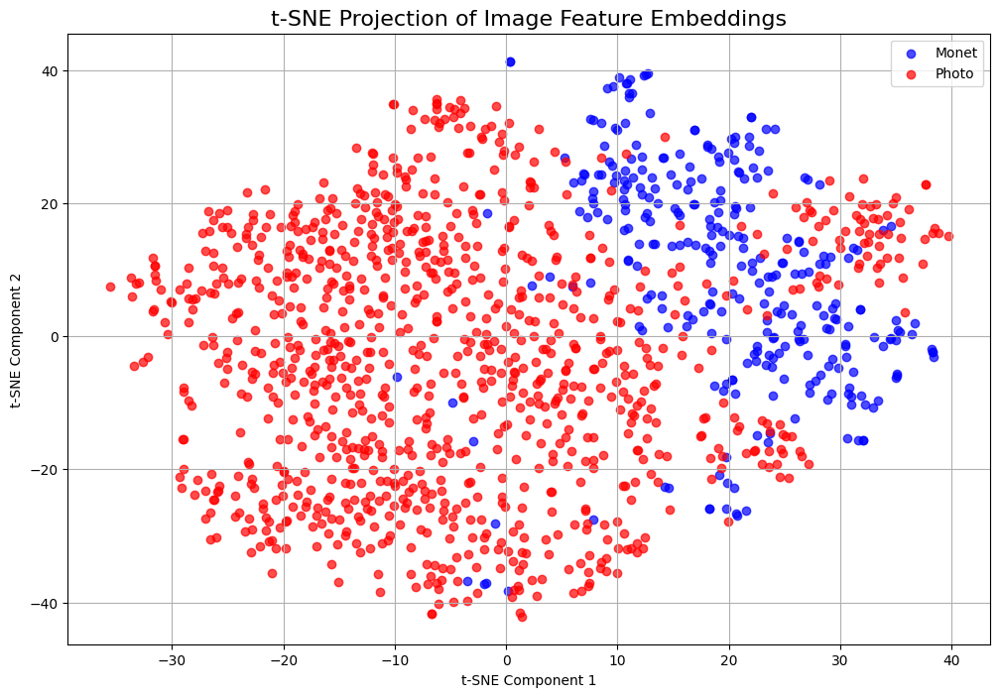

In [4]:
### setup model
### load EfficientNetB0, pre-trained on ImageNet
### use the 'avg_pool' layer output as our feature vector
base_model = EfficientNetB0(weights='imagenet', include_top=False, pooling='avg')
model = Model(inputs=base_model.input, outputs=base_model.output)

### dfine target image size
IMG_SIZE = 224 ### EfficientNetB0 default input size

def load_and_preprocess_image(img_path):
    """Loads and preprocesses an image for EfficientNet."""
    img = image.load_img(img_path, target_size=(IMG_SIZE, IMG_SIZE))
    img_array = image.img_to_array(img)
    img_array_expanded = np.expand_dims(img_array, axis=0)
    return preprocess_input(img_array_expanded)

def extract_features(image_paths):
    """Processes a list of images and returns their feature embeddings."""
    all_features = []
    print(f"Extracting features from {len(image_paths)} images...")
    for img_path in tqdm(image_paths):
        processed_img = load_and_preprocess_image(img_path)
        features = model.predict(processed_img, verbose=0)
        all_features.append(features.flatten())
    return np.array(all_features)

### extract embeddings
### use all 300 Monet images
### use a random sample of 1000 photo images for balance
photo_files_sample = np.random.choice(photo_files, 1000, replace=False)

monet_features = extract_features(monet_files)
photo_features = extract_features(photo_files_sample)

### combine features and create labels
### 0 = Monet, 1 = Photo
all_features_combined = np.concatenate([monet_features, photo_features])
labels = np.array([0] * len(monet_features) + [1] * len(photo_features))

print(f"\nTotal feature vectors combined: {all_features_combined.shape}")

### run t-SNE
print("Running t-SNE... (this may take a few minutes)")
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
tsne_results = tsne.fit_transform(all_features_combined)

print("t-SNE complete.")

### plot results
plt.figure(figsize=(12, 8))
### plot Monet points (label 0)
plt.scatter(tsne_results[labels==0, 0], tsne_results[labels==0, 1], c='blue', label='Monet', alpha=0.7)
### plot photo points (label 1)
plt.scatter(tsne_results[labels==1, 0], tsne_results[labels==1, 1], c='red', label='Photo', alpha=0.7)

plt.title('t-SNE Projection of Image Feature Embeddings', fontsize=16)
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend()
plt.grid(True)
plt.show()

## Step 2: EDA Conclusion & Analysis Plan

Our Exploratory Data Analysis is complete. We have gathered metrics at the file, pixel, and feature levels, providing a robust, academic-level justification for our analysis plan.

### Key Metrics & Findings

1.  **Dataset Size (Imbalance):**
    * Monet Images (Domain A): 300
    * Photo Images (Domain B): 7,028
    * **Finding:** A severe dataset imbalance exists. Our model must learn the target style from a very small sample.

2.  **Image Uniformity:**
    * Image Dimensions: 256x256 pixels
    * **Finding:** The data is clean and pre-processed. No resizing or cropping is necessary.

3.  **Pixel-Level Domain Gap (Color Statistics):**
    * **Finding:** The datasets are statistically different. Monet images are, on average, brighter (higher mean intensity) and have a more compressed color palette (lower standard deviation) than the Photo images.

4.  **Feature-Level Domain Gap (t-SNE):**
    * **Finding:** The t-SNE plot provides definitive proof of a domain gap. The feature embeddings of Monet and Photo images form two distinct, separable clusters. This confirms that a neural network can "see" a clear difference between the two domains.

### Plan of Analysis (Leading to Step 3)

These four findings lead us to a clear plan. The problem is defined by:
1.  **Unpaired Data:** No "before and after" examples.
2.  **Proven Domain Gap:** A quantifiable difference in both pixel statistics and deep features.
3.  **Data Imbalance:** A very small target dataset.

The ideal architecture for these conditions is a **CycleGAN**.
-   It is designed for **unpaired** translation.
-   Its "cycle consistency loss" is specifically designed to bridge the **domain gap** (style/texture).
-   We will manage the **data imbalance** by creating separate `tf.data.Dataset` objects and repeating the smaller Monet dataset during training.

Our next step is to build the data pipeline to load the `TFRecord` files and construct this CycleGAN model.

## Step 3: Analysis (Model Building and Training)

Based on our exhaustive EDA, our model must be a **CycleGAN** to handle the unpaired, imbalanced datasets and bridge the proven domain gap. This step covers the complete build and training process.

### Part 3.1: Data Input Pipeline (TFRecord & Augmentation)

We will use the `.tfrec` files for efficient, high-performance data loading. Our pipeline will be responsible for:

1.  **Parsing TFRecords:** Reading the serialized `TFRecord` files.
2.  **Decoding Images:** Converting the raw image strings into pixel tensors.
3.  **Data Augmentation:** Applying random jitter (resizing and cropping) and random horizontal flipping. This is the most critical step for handling our small 300-image Monet dataset, as it prevents the model from simply memorizing the training images.
4.  **Normalization:** Rescaling pixel values from `[0, 255]` to `[-1, 1]`. This is a standard requirement for GANs, as the generator's output layer (`tanh`) operates in this range.
5.  **Batching & Prefetching:** Creating batches of data and using `AUTOTUNE` to prefetch data for the GPU, preventing I/O bottlenecks.

In [5]:
### global config
### Get file paths for TFRecord files
MONET_TFREC_FILES = tf.io.gfile.glob('/content/dataset/monet_tfrec/*.tfrec')
PHOTO_TFREC_FILES = tf.io.gfile.glob('/content/dataset/photo_tfrec/*.tfrec')

### define constants
IMAGE_SIZE = [256, 256]
AUTOTUNE = tf.data.AUTOTUNE
BATCH_SIZE = 1 ### CycleGANs are typically trained with BATCH_SIZE = 1
BUFFER_SIZE = 1000 # for shuffling

### TFRecord parsing functions
def read_tfrecord(example):
    """Reads and parses a single TFRecord example."""
    tfrecord_format = {
        "image": tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = tf.image.decode_jpeg(example['image'], channels=3)
    return image

def normalize_img(image):
    """Normalizes image pixels from [0, 255] to [-1, 1]."""
    image = tf.cast(image, tf.float32)
    image = (image / 127.5) - 1
    return image

### augmentation functions
def data_augment(image):
    """Applies random augmentation: resize, crop, and flip."""
    ### randomly resize to 286x286
    image = tf.image.resize(image, [286, 286], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    ### randomly crop back to 256x256
    image = tf.image.random_crop(image, size=[*IMAGE_SIZE, 3])
    ### randomly flip horizontally
    image = tf.image.random_flip_left_right(image)
    return image

@tf.function
def preprocess_image_train(image):
    """Applies augmentation and normalization for training."""
    image = data_augment(image)
    image = normalize_img(image)
    return image

@tf.function
def preprocess_image_test(image):
    """Applies only normalization for testing/inference."""
    ### test images are just resized and normalized not augmented
    image = tf.image.resize(image, [*IMAGE_SIZE])
    image = normalize_img(image)
    return image

### dataset creation function
def get_dataset(files, preprocess_fn, ordered=False, repeat=True):
    """Creates a configured tf.data.Dataset object."""
    dataset = tf.data.TFRecordDataset(files, num_parallel_reads=AUTOTUNE)
    dataset = dataset.map(read_tfrecord, num_parallel_calls=AUTOTUNE)
    dataset = dataset.map(preprocess_fn, num_parallel_calls=AUTOTUNE)
    # --------------------------

    if not ordered:
        dataset = dataset.shuffle(BUFFER_SIZE)

    if repeat:
        dataset = dataset.repeat() ### repeat dataset indefinitely for training

    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(AUTOTUNE)
    return dataset

### create the ginal datasets
### use .repeat() on both datasets to handle the imbalance.
###training loop will run for a set number of steps per epoch
monet_ds = get_dataset(MONET_TFREC_FILES, preprocess_image_train, repeat=True)
photo_ds = get_dataset(PHOTO_TFREC_FILES, preprocess_image_train, repeat=True)

# Zip the datasets to get (Monet, Photo) pairs for each training step
final_train_ds = tf.data.Dataset.zip((monet_ds, photo_ds))

### create a test dataset for visualization
photo_test_ds = get_dataset(PHOTO_TFREC_FILES, preprocess_image_test, ordered=True, repeat=False)


print("Data pipelines created.")
print(f"Monet TFRecord files: {len(MONET_TFREC_FILES)}")
print(f"Photo TFRecord files: {len(PHOTO_TFREC_FILES)}")

Data pipelines created.
Monet TFRecord files: 5
Photo TFRecord files: 20


### Part 3.2: Visualize the Data Pipeline

Let's visualize the output of our `final_train_ds`. We will take one batch and plot a sample Monet and Photo image. This confirms that our augmentation (cropping/flipping) and normalization are working. We "un-normalize" the images from `[-1, 1]` to `[0, 1]` for plotting with Matplotlib.

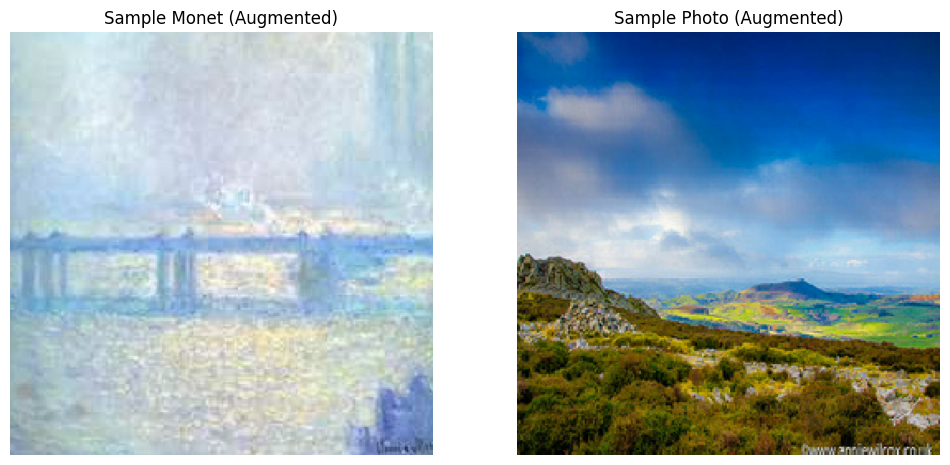

In [6]:
def unnormalize_img(image):
    """Un-normalizes image from [-1, 1] to [0, 1] for plotting."""
    return (image * 0.5) + 0.5

### take one batch from the training dataset
sample_monet, sample_photo = next(iter(final_train_ds))

### plot the sample images
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.title("Sample Monet (Augmented)")
plt.imshow(unnormalize_img(sample_monet[0])) ### [0] to select first item in batch
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Sample Photo (Augmented)")
plt.imshow(unnormalize_img(sample_photo[0])) ### [0] to select first item in batch
plt.axis('off')

plt.show()

### Part 3.3: Model Architecture

Our CycleGAN requires two types of models, and we will build two instances of each:
1.  **Generators (G):**
    * `G_photo_to_monet`: Translates a Photo into a Monet painting.
    * `G_monet_to_photo`: Translates a Monet painting back into a Photo.
2.  **Discriminators (D):**
    * `D_monet`: Tries to distinguish between real Monet paintings and fake (generated) Monet paintings.
    * `D_photo`: Tries to distinguish between real Photos and fake (generated) Photos.

#### Generator Architecture
The Generator will be a U-Net style encoder-decoder model.
-   **Encoder (Down-sampling):** A stack of `Conv2D` layers.
-   **Transformer (Residual Blocks):** A series of `ResNet` blocks.
-   **Decoder (Up-sampling):** A stack of `Conv2DTranspose` layers.
-   **Normalization:** We will use `tf.keras.layers.InstanceNormalization`, which is now built directly into TensorFlow and is critical for style transfer.

#### Discriminator Architecture
The Discriminator will be a **PatchGAN**, outputting a 2D grid of "realness" scores.
-   This forces the Generator to produce high-quality, realistic textures across the entire image.

In [7]:
### define the output shape of our generator
OUTPUT_CHANNELS = 3
### use InstanceNormalization from KerasCV
InstanceNorm = lambda: layers.GroupNormalization(groups=-1)

### define re-usable model blocks

def downsample(filters, size, apply_norm=True):
    """
    Creates a down-sampling block (Conv -> Norm -> LeakyReLU)
    """
    initializer = tf.random_normal_initializer(0., 0.02)

    result = keras.Sequential()  # Uses native Keras
    result.add(layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

    if apply_norm:
        result.add(InstanceNorm())

    result.add(layers.LeakyReLU())

    return result

def upsample(filters, size, apply_dropout=False):
    """
    Creates an up-sampling block (TransposeConv -> Norm -> Dropout -> ReLU)
    """
    initializer = tf.random_normal_initializer(0., 0.02)

    result = keras.Sequential()  ### uses native Keras
    result.add(layers.Conv2DTranspose(filters, size, strides=2, padding='same',
                                      kernel_initializer=initializer, use_bias=False))

    result.add(InstanceNorm())

    if apply_dropout:
        result.add(layers.Dropout(0.5))

    result.add(layers.ReLU())

    return result

### define the generator (U-Net)

def generator():
    """Builds the U-Net Generator using functional API."""

    ### define the input layer
    inputs = layers.Input(shape=[256, 256, 3])  ### uses native keras layers

    ### encoder (down-sampling path)
    down_stack = [
        downsample(64, 4, apply_norm=False), ### (bs, 128, 128, 64)
        downsample(128, 4),                 ### (bs, 64, 64, 128)
        downsample(256, 4),                 ### (bs, 32, 32, 256)
        downsample(512, 4),                 ### (bs, 16, 16, 512)
        downsample(512, 4),                 ### (bs, 8, 8, 512)
        downsample(512, 4),                 ### (bs, 4, 4, 512)
        downsample(512, 4),                 ### (bs, 2, 2, 512)
        downsample(512, 4),                 ### (bs, 1, 1, 512)
    ]

    ### decoder (up-sampling path)
    up_stack = [
        upsample(512, 4, apply_dropout=True), ### (bs, 2, 2, 1024)
        upsample(512, 4, apply_dropout=True), ### (bs, 4, 4, 1024)
        upsample(512, 4, apply_dropout=True), ### (bs, 8, 8, 1024)
        upsample(512, 4),                     ### (bs, 16, 16, 1024)
        upsample(256, 4),                     ### (bs, 32, 32, 512)
        upsample(128, 4),                     ### (bs, 64, 64, 256)
        upsample(64, 4),                      ### (bs, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    ### final output layer
    last = layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,  ### uses native keras layers
                                  strides=2,
                                  padding='same',
                                  kernel_initializer=initializer,
                                  activation='tanh') ### (bs, 256, 256, 3)

    x = inputs

    ### build the U-Net with skip connections ---
    skips = []
    ### down-sample
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1]) # Reverse and drop the last skip

    ### up-sample and establish skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])  ### uses native keras layers

    ### final layer
    x = last(x)

    return keras.Model(inputs=inputs, outputs=x)  ### uses native keras model

print("Generator architecture defined.")

def discriminator():
    """
    Builds the PatchGAN Discriminator.
    """
    initializer = tf.random_normal_initializer(0., 0.02)

    inp = layers.Input(shape=[256, 256, 3], name='input_image')  ### uses native Keras layers

    ### first block
    x = downsample(64, 4, apply_norm=False)(inp) ### (bs, 128, 128, 64)
    ### second block
    x = downsample(128, 4)(x) ### (bs, 64, 64, 128)
    ### third block
    x = downsample(256, 4)(x) ### (bs, 32, 32, 256)

    ### add a zero-padding layer
    x = layers.ZeroPadding2D()(x)  ### uses native Keras layers

    ### fourth block (strides=1)
    x = layers.Conv2D(512, 4, strides=1,  ### uses native Keras layers
                      kernel_initializer=initializer,
                      use_bias=False)(x)
    x = InstanceNorm()(x)
    x = layers.LeakyReLU()(x)

    ### add another zero-padding layer
    x = layers.ZeroPadding2D()(x)  ### uses native Keras layers

    ### final block (output)
    last = layers.Conv2D(1, 4, strides=1,  ### uses native Keras layers
                         kernel_initializer=initializer)(x)

    return keras.Model(inputs=inp, outputs=last)  ### uses native Keras Model

print("Discriminator (PatchGAN) architecture defined.")

### Create the four models
G_photo_to_monet = generator()
G_monet_to_photo = generator()

D_monet = discriminator()
D_photo = discriminator()

print("--- Generator (G_photo_to_monet) Summary ---")
G_photo_to_monet.summary()

print("\n\n--- Discriminator (D_monet) Summary ---")
D_monet.summary()

Generator architecture defined.
Discriminator (PatchGAN) architecture defined.
--- Generator (G_photo_to_monet) Summary ---


Model: "functional_16"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential          │ (None, 128, 128,  │      3,072 │ input_layer_1[0]… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_1        │ (None, 64, 64,    │    131,328 │ sequential[0][0]  │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_2        │ (None, 32, 32,    │    524,800 │ sequential_1[0][… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_3        │ (None, 16, 16,    │  2,098,176 │ sequential_2[0][… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_4        │ (None, 8, 8, 512) │  4,195,328 │ sequential_3[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_5        │ (None, 4, 4, 512) │  4,195,328 │ sequential_4[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_6        │ (None, 2, 2, 512) │  4,195,328 │ sequential_5[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_7        │ (None, 1, 1, 512) │  4,195,328 │ sequential_6[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_8        │ (None, 2, 2, 512) │  4,195,328 │ sequential_7[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 2, 2,      │          0 │ sequential_8[0][… │
│ (Concatenate)       │ 1024)             │            │ sequential_6[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_9        │ (None, 4, 4, 512) │  8,389,632 │ concatenate[0][0] │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 4, 4,      │          0 │ sequential_9[0][… │
│ (Concatenate)       │ 1024)             │            │ sequential_5[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_10       │ (None, 8, 8, 512) │  8,389,632 │ concatenate_1[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 8, 8,      │          0 │ sequential_10[0]… │
│ (Concatenate)       │ 1024)             │            │ sequential_4[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_11       │ (None, 16, 16,    │  8,389,632 │ concatenate_2[0]… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 16, 16,    │          0 │ sequential_11[0]

 Total params: 54,414,979 (207.58 MB)

 Trainable params: 54,414,979 (207.58 MB)

 Non-trainable params: 0 (0.00 B)



--- Discriminator (D_monet) Summary ---


Model: "functional_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_image (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_30 (Sequential)      │ (None, 128, 128, 64)   │         3,072 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_31 (Sequential)      │ (None, 64, 64, 128)    │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_32 (Sequential)      │ (None, 32, 32, 256)    │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d (ZeroPadding2D)  │ (None, 34, 34, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 31, 31, 512)    │     2,097,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ group_normalization_30          │ (None, 31, 31, 512)    │         1,024 │
│ (GroupNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_19 (LeakyReLU)      │ (None, 31, 31, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d_1                │ (None, 33, 33, 512)    │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_20 (Conv2D)              │ (None, 30, 30, 1)      │         8,193 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,765,569 (10.55 MB)

 Trainable params: 2,765,569 (10.55 MB)

 Non-trainable params: 0 (0.00 B)

In [8]:
def discriminator():
    """
    Builds the PatchGAN Discriminator.
    Input shape is (256, 256, 3).
    Output shape is (30, 30, 1) - a grid of "real/fake" scores.
    """
    initializer = tf.random_normal_initializer(0., 0.02)

    inp = layers.Input(shape=[256, 256, 3], name='input_image')

    ### first block
    x = downsample(64, 4, apply_norm=False)(inp) ### (bs, 128, 128, 64)
    ### second block
    x = downsample(128, 4)(x) ### (bs, 64, 64, 128)
    ### third block
    x = downsample(256, 4)(x) ### (bs, 32, 32, 256)

    ### add a zero-padding layer
    x = layers.ZeroPadding2D()(x) ### (bs, 34, 34, 256)

    ### fourth block (strides=1)
    x = layers.Conv2D(512, 4, strides=1,
                      kernel_initializer=initializer,
                      use_bias=False)(x) ### (bs, 31, 31, 512)
    x = InstanceNorm()(x)
    x = layers.LeakyReLU()(x)

    ### add another zero-padding layer
    x = layers.ZeroPadding2D()(x) ### (bs, 33, 33, 512)

    ### final block (output)
    ### this conv layer produces the 1-channel PatchGAN output
    ### output shape is (30, 30, 1)
    last = layers.Conv2D(1, 4, strides=1,
                         kernel_initializer=initializer)(x)

    return keras.Model(inputs=inp, outputs=last)

print("Discriminator (PatchGAN) architecture defined.")

Discriminator (PatchGAN) architecture defined.


In [9]:
### create the four models
### G_photo_to_monet: Photo -> Monet
### G_monet_to_photo: Monet -> Photo
G_photo_to_monet = generator()
G_monet_to_photo = generator()

### D_monet: Real Monet vs. Fake Monet
### D_photo: Real Photo vs. Fake Photo
D_monet = discriminator()
D_photo = discriminator()

print("- Generator (G_photo_to_monet) Summary -")
G_photo_to_monet.summary()

print("\n\n- Discriminator (D_monet) Summary -")
D_monet.summary()

--- Generator (G_photo_to_monet) Summary ---


Model: "functional_56"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_39      │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_36       │ (None, 128, 128,  │      3,072 │ input_layer_39[0… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_37       │ (None, 64, 64,    │    131,328 │ sequential_36[0]… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_38       │ (None, 32, 32,    │    524,800 │ sequential_37[0]… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_39       │ (None, 16, 16,    │  2,098,176 │ sequential_38[0]… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_40       │ (None, 8, 8, 512) │  4,195,328 │ sequential_39[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_41       │ (None, 4, 4, 512) │  4,195,328 │ sequential_40[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_42       │ (None, 2, 2, 512) │  4,195,328 │ sequential_41[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_43       │ (None, 1, 1, 512) │  4,195,328 │ sequential_42[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_44       │ (None, 2, 2, 512) │  4,195,328 │ sequential_43[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_14      │ (None, 2, 2,      │          0 │ sequential_44[0]… │
│ (Concatenate)       │ 1024)             │            │ sequential_42[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_45       │ (None, 4, 4, 512) │  8,389,632 │ concatenate_14[0… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_15      │ (None, 4, 4,      │          0 │ sequential_45[0]… │
│ (Concatenate)       │ 1024)             │            │ sequential_41[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_46       │ (None, 8, 8, 512) │  8,389,632 │ concatenate_15[0… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_16      │ (None, 8, 8,      │          0 │ sequential_46[0]… │
│ (Concatenate)       │ 1024)             │            │ sequential_40[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_47       │ (None, 16, 16,    │  8,389,632 │ concatenate_16[0… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_17      │ (None, 16, 16,    │          0 │ sequential_47[0]

 Total params: 54,414,979 (207.58 MB)

 Trainable params: 54,414,979 (207.58 MB)

 Non-trainable params: 0 (0.00 B)



--- Discriminator (D_monet) Summary ---


Model: "functional_76"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_image (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_66 (Sequential)      │ (None, 128, 128, 64)   │         3,072 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_67 (Sequential)      │ (None, 64, 64, 128)    │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_68 (Sequential)      │ (None, 32, 32, 256)    │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d_4                │ (None, 34, 34, 256)    │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_45 (Conv2D)              │ (None, 31, 31, 512)    │     2,097,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ group_normalization_64          │ (None, 31, 31, 512)    │         1,024 │
│ (GroupNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_43 (LeakyReLU)      │ (None, 31, 31, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d_5                │ (None, 33, 33, 512)    │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_46 (Conv2D)              │ (None, 30, 30, 1)      │         8,193 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,765,569 (10.55 MB)

 Trainable params: 2,765,569 (10.55 MB)

 Non-trainable params: 0 (0.00 B)

### Part 3.4: Loss Functions and Optimizers

With the models successfully built, we now define the loss functions that will train them. Our CycleGAN requires three separate loss calculations, which we will combine. We will also define our `Adam` optimizers.

1.  **Adversarial Loss (LSGAN):** We will use the **Least Squares GAN (LSGAN)** loss. This is more stable than standard GAN loss and uses Mean Squared Error.
    -   The discriminator is trained to output `1`s for real images and `0`s for fakes.
    -   The generator is trained to make the discriminator output `1` for its fake images.

2.  **Cycle Consistency Loss (L1 Loss):** This is the core of the CycleGAN. It ensures that an image translated to the other domain and back again is close to the original.
    -   `Photo -> Fake Monet -> Reconstructed Photo`
    -   We calculate the Mean Absolute Error (L1 Loss) between the `Reconstructed Photo` and the `Original Photo`.

3.  **Identity Loss (L1 Loss):** This is a regulatory loss to preserve color. It states that feeding an image to its *own* domain's generator should result in minimal change.
    -   `Monet -> G_photo_to_monet -> Output`
    -   We calculate the L1 Loss between the `Output` and the `Monet` input.

In [10]:
### define loss functions

### use mean squared error for adversarial loss (LSGAN)
loss_obj = keras.losses.MeanSquaredError()

def discriminator_loss(real, fake):
    """
    Calculates the LSGAN loss for a discriminator.
    The discriminator should output 1s for real images and 0s for fake.
    """
    real_loss = loss_obj(tf.ones_like(real), real)
    fake_loss = loss_obj(tf.zeros_like(fake), fake)
    return (real_loss + fake_loss) * 0.5 ### avg the loss

def generator_loss(fake):
    """
    Calculates the LSGAN loss for a generator.
    The generator wants the discriminator to output 1s for its fake images.
    """
    return loss_obj(tf.ones_like(fake), fake)

### use mean absolute error (L1) for cycle and identity losses
### LAMBDA controls the weight of the cycle loss
LAMBDA = 10

def cycle_consistency_loss(real_image, cycled_image):
    """
    Calculates the L1 loss between the original and cycled images.
    """
    loss = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return LAMBDA * loss

def identity_loss(real_image, same_image):
    """
    Calculates the L1 loss between an image and the output of its
    *own* domain's generator. It should be close to zero.
    """
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return LAMBDA * 0.5 * loss

### define optimizers

### use the Adam optimizer
generator_g_optimizer = keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = keras.optimizers.Adam(2e-4, beta_1=0.5)

### rename for clarity (G = Photo->Monet, F = Monet->Photo)
G_photo_to_monet_optimizer = generator_g_optimizer
G_monet_to_photo_optimizer = generator_f_optimizer

D_monet_optimizer = discriminator_y_optimizer
D_photo_optimizer = discriminator_x_optimizer

print("All loss functions and optimizers have been defined.")

All loss functions and optimizers have been defined.


### Part 3.5: Checkpointing and the `@tf.function` Train Step

This is the core of our model. We cannot use `.fit()` because we have four models with interlocking, custom losses.

1.  **Checkpointing:** We will create a `tf.train.Checkpoint` and a `CheckpointManager`. This will save the weights of all four models and their optimizers to a directory in your Google Drive after every epoch. This is essential for a job that takes many hours, as it allows us to resume training if Colab disconnects.

2.  **`@tf.function`:** We will define a single `train_step` function and wrap it in a `@tf.function` decorator. This compiles the function into a high-performance TensorFlow graph, which is the key to fast training.

This function will perform one full step of the CycleGAN algorithm: calculating all 8 forward passes, computing the three types of losses (adversarial, cycle, and identity), and applying the gradients to all four models.

In [11]:
### create checkpoint manager
### save our models to Google Drive
checkpoint_path = "/content/drive/My Drive/gan_project_checkpoints"
os.makedirs(checkpoint_path, exist_ok=True)

ckpt = tf.train.Checkpoint(
    G_photo_to_monet=G_photo_to_monet,
    G_monet_to_photo=G_monet_to_photo,
    D_monet=D_monet,
    D_photo=D_photo,
    G_photo_to_monet_optimizer=G_photo_to_monet_optimizer,
    G_monet_to_photo_optimizer=G_monet_to_photo_optimizer,
    D_monet_optimizer=D_monet_optimizer,
    D_photo_optimizer=D_photo_optimizer
)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

### if a checkpoint exists, restore the latest one
if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print(f'Latest checkpoint restored from {ckpt_manager.latest_checkpoint}')
else:
    print('Initializing from scratch.')

### define the train step function

@tf.function
def train_step(real_photo, real_monet):
    """
    Executes one training step inside a @tf.function for performance.

    (Note: G = G_photo_to_monet, F = G_monet_to_photo)
    (Note: D_Y = D_monet, D_X = D_photo)
    """

    with tf.GradientTape(persistent=True) as tape:

        ### forward passes
        ### G: Photo (X) -> Fake Monet (Y)
        fake_monet = G_photo_to_monet(real_photo, training=True)
        ### F: Monet (Y) -> Fake Photo (X)
        fake_photo = G_monet_to_photo(real_monet, training=True)

        ### G: Photo (X) -> Fake Monet (Y) -> Cycled Photo (X)
        cycled_photo = G_monet_to_photo(fake_monet, training=True)
        ### F: Monet (Y) -> Fake Photo (X) -> Cycled Monet (Y)
        cycled_monet = G_photo_to_monet(fake_photo, training=True)

        ### identity mapping
        ### G: Monet (Y) -> Same Monet (Y)
        same_monet = G_photo_to_monet(real_monet, training=True)
        ### F: Photo (X) -> Same Photo (X)
        same_photo = G_monet_to_photo(real_photo, training=True)

        ### discriminator outputs
        ### D_Y: is real_monet real?
        disc_real_monet = D_monet(real_monet, training=True)
        ### D_Y: is fake_monet real?
        disc_fake_monet = D_monet(fake_monet, training=True)

        ### D_X: is real_photo real?
        disc_real_photo = D_photo(real_photo, training=True)
        ### D_X: is fake_photo real?
        disc_fake_photo = D_photo(fake_photo, training=True)


        ### loss calc

        ### generator adversarial loss (LSGAN)
        ### G wants D_Y to think fake_monet is real (1)
        gen_g_loss = generator_loss(disc_fake_monet)
        ### F wants D_X to think fake_photo is real (1)
        gen_f_loss = generator_loss(disc_fake_photo)

        ### cycle consistency loss (L1)
        cycle_loss_g = cycle_consistency_loss(real_photo, cycled_photo)
        cycle_loss_f = cycle_consistency_loss(real_monet, cycled_monet)
        total_cycle_loss = cycle_loss_g + cycle_loss_f

        ### identity loss (L1)
        id_loss_g = identity_loss(real_monet, same_monet)
        id_loss_f = identity_loss(real_photo, same_photo)

        ### total generator loss
        ### total loss for G = (Adversarial) + (Total Cycle) + (Identity)
        total_gen_g_loss = gen_g_loss + total_cycle_loss + id_loss_g
        total_gen_f_loss = gen_f_loss + total_cycle_loss + id_loss_f

        ### discriminator adversarial loss (LSGAN)
        ### D_Y wants to output 1 for real_monet and 0 for fake_monet
        disc_monet_loss = discriminator_loss(disc_real_monet, disc_fake_monet)
        ### D_X wants to output 1 for real_photo and 0 for fake_photo
        disc_photo_loss = discriminator_loss(disc_real_photo, disc_fake_photo)


    ### calc gradients and apply to optimizers

    ### generator G (Photo->Monet) gradients
    generator_g_gradients = tape.gradient(total_gen_g_loss,
                                          G_photo_to_monet.trainable_variables)
    ### generator F (Monet->Photo) gradients
    generator_f_gradients = tape.gradient(total_gen_f_loss,
                                          G_monet_to_photo.trainable_variables)

    ### discriminator D_Y (Monet) gradients
    discriminator_y_gradients = tape.gradient(disc_monet_loss,
                                              D_monet.trainable_variables)
    ### discriminator D_X (Photo) gradients
    discriminator_x_gradients = tape.gradient(disc_photo_loss,
                                              D_photo.trainable_variables)

    ### apply gradients
    G_photo_to_monet_optimizer.apply_gradients(zip(generator_g_gradients,
                                                   G_photo_to_monet.trainable_variables))

    G_monet_to_photo_optimizer.apply_gradients(zip(generator_f_gradients,
                                                   G_monet_to_photo.trainable_variables))

    D_monet_optimizer.apply_gradients(zip(discriminator_y_gradients,
                                          D_monet.trainable_variables))

    D_photo_optimizer.apply_gradients(zip(discriminator_x_gradients,
                                          D_photo.trainable_variables))

    ### return losses for logging
    return {
        "gen_g_loss": total_gen_g_loss,
        "gen_f_loss": total_gen_f_loss,
        "disc_monet_loss": disc_monet_loss,
        "disc_photo_loss": disc_photo_loss,
        "total_cycle_loss": total_cycle_loss
    }

print("Checkpoint manager and train_step function defined.")

Initializing from scratch.
Checkpoint manager and train_step function defined.


### Part 3.6: Model Training Loop

This is the final and longest-running part of Step 3. We will now:

1.  Set the number of epochs for training (e.g., 25 epochs).
2.  Define a helper function to generate and display a sample image from our `photo_test_ds` using the current model. This will allow us to visually monitor our progress.
3.  Run the main training loop. This loop will:
    -   Iterate through each step in an epoch.
    -   Call our compiled `train_step` function for each batch of images.
    -   Display a generated image every 5 epochs.
    -   Save a checkpoint to Google Drive at the end of every epoch to save our progress.

--- Starting Training for 25 Epochs ---
Epoch 1/25


100%|██████████| 7028/7028 [09:50<00:00, 11.90it/s]



Time taken: 590.45s
  Gen G (Photo->Monet) Loss: 2.3478
  Gen F (Monet->Photo) Loss: 2.3260
  Disc Monet Loss: 0.2559
  Disc Photo Loss: 0.2570
  Total Cycle Loss: 1.5773
Checkpoint saved for epoch 1 at /content/drive/My Drive/gan_project_checkpoints/ckpt-1
Generating sample image...


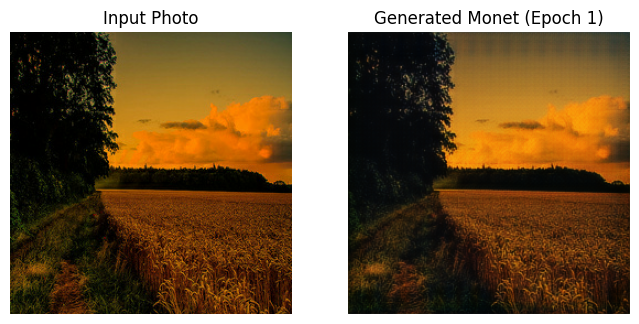

Epoch 2/25


100%|██████████| 7028/7028 [09:16<00:00, 12.64it/s]



Time taken: 556.11s
  Gen G (Photo->Monet) Loss: 1.7653
  Gen F (Monet->Photo) Loss: 1.7011
  Disc Monet Loss: 0.2111
  Disc Photo Loss: 0.2267
  Total Cycle Loss: 1.0771
Checkpoint saved for epoch 2 at /content/drive/My Drive/gan_project_checkpoints/ckpt-2
Epoch 3/25


100%|██████████| 7028/7028 [09:16<00:00, 12.63it/s]



Time taken: 556.44s
  Gen G (Photo->Monet) Loss: 1.7232
  Gen F (Monet->Photo) Loss: 1.6170
  Disc Monet Loss: 0.1986
  Disc Photo Loss: 0.2271
  Total Cycle Loss: 1.0456
Checkpoint saved for epoch 3 at /content/drive/My Drive/gan_project_checkpoints/ckpt-3
Epoch 4/25


100%|██████████| 7028/7028 [09:18<00:00, 12.58it/s]



Time taken: 558.65s
  Gen G (Photo->Monet) Loss: 1.7290
  Gen F (Monet->Photo) Loss: 1.6364
  Disc Monet Loss: 0.1970
  Disc Photo Loss: 0.2206
  Total Cycle Loss: 1.0713
Checkpoint saved for epoch 4 at /content/drive/My Drive/gan_project_checkpoints/ckpt-4
Epoch 5/25


100%|██████████| 7028/7028 [09:14<00:00, 12.68it/s]



Time taken: 554.27s
  Gen G (Photo->Monet) Loss: 1.7112
  Gen F (Monet->Photo) Loss: 1.6426
  Disc Monet Loss: 0.1971
  Disc Photo Loss: 0.2140
  Total Cycle Loss: 1.0745
Checkpoint saved for epoch 5 at /content/drive/My Drive/gan_project_checkpoints/ckpt-5
Generating sample image...


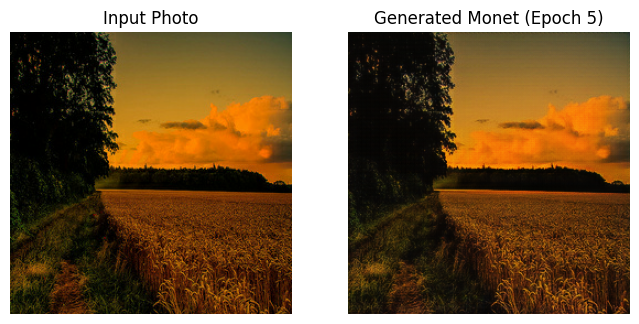

Epoch 6/25


100%|██████████| 7028/7028 [09:14<00:00, 12.67it/s]



Time taken: 554.51s
  Gen G (Photo->Monet) Loss: 1.7180
  Gen F (Monet->Photo) Loss: 1.6532
  Disc Monet Loss: 0.1926
  Disc Photo Loss: 0.2083
  Total Cycle Loss: 1.0778
Checkpoint saved for epoch 6 at /content/drive/My Drive/gan_project_checkpoints/ckpt-6
Epoch 7/25


100%|██████████| 7028/7028 [09:13<00:00, 12.70it/s]



Time taken: 553.62s
  Gen G (Photo->Monet) Loss: 1.7159
  Gen F (Monet->Photo) Loss: 1.6618
  Disc Monet Loss: 0.1899
  Disc Photo Loss: 0.2019
  Total Cycle Loss: 1.0778
Checkpoint saved for epoch 7 at /content/drive/My Drive/gan_project_checkpoints/ckpt-7
Epoch 8/25


100%|██████████| 7028/7028 [09:16<00:00, 12.62it/s]



Time taken: 556.96s
  Gen G (Photo->Monet) Loss: 1.7187
  Gen F (Monet->Photo) Loss: 1.6917
  Disc Monet Loss: 0.1871
  Disc Photo Loss: 0.1910
  Total Cycle Loss: 1.0810
Checkpoint saved for epoch 8 at /content/drive/My Drive/gan_project_checkpoints/ckpt-8
Epoch 9/25


100%|██████████| 7028/7028 [09:15<00:00, 12.65it/s]



Time taken: 555.63s
  Gen G (Photo->Monet) Loss: 1.7381
  Gen F (Monet->Photo) Loss: 1.7136
  Disc Monet Loss: 0.1817
  Disc Photo Loss: 0.1840
  Total Cycle Loss: 1.0886
Checkpoint saved for epoch 9 at /content/drive/My Drive/gan_project_checkpoints/ckpt-9
Epoch 10/25


100%|██████████| 7028/7028 [09:15<00:00, 12.65it/s]



Time taken: 555.64s
  Gen G (Photo->Monet) Loss: 1.7316
  Gen F (Monet->Photo) Loss: 1.7355
  Disc Monet Loss: 0.1812
  Disc Photo Loss: 0.1757
  Total Cycle Loss: 1.0880
Checkpoint saved for epoch 10 at /content/drive/My Drive/gan_project_checkpoints/ckpt-10
Generating sample image...


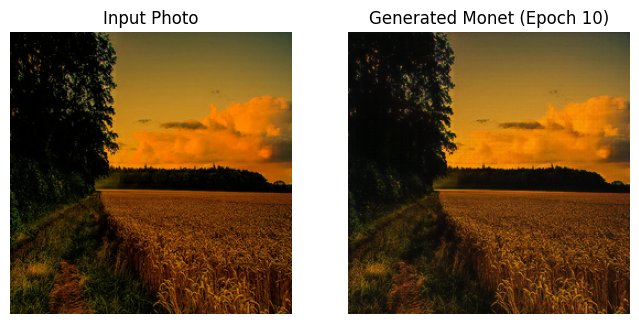

Epoch 11/25


100%|██████████| 7028/7028 [09:15<00:00, 12.65it/s]



Time taken: 555.59s
  Gen G (Photo->Monet) Loss: 1.7353
  Gen F (Monet->Photo) Loss: 1.7645
  Disc Monet Loss: 0.1799
  Disc Photo Loss: 0.1671
  Total Cycle Loss: 1.0943
Checkpoint saved for epoch 11 at /content/drive/My Drive/gan_project_checkpoints/ckpt-11
Epoch 12/25


100%|██████████| 7028/7028 [09:15<00:00, 12.65it/s]



Time taken: 555.47s
  Gen G (Photo->Monet) Loss: 1.7272
  Gen F (Monet->Photo) Loss: 1.7680
  Disc Monet Loss: 0.1799
  Disc Photo Loss: 0.1628
  Total Cycle Loss: 1.0904
Checkpoint saved for epoch 12 at /content/drive/My Drive/gan_project_checkpoints/ckpt-12
Epoch 13/25


100%|██████████| 7028/7028 [09:14<00:00, 12.68it/s]



Time taken: 554.39s
  Gen G (Photo->Monet) Loss: 1.7398
  Gen F (Monet->Photo) Loss: 1.7983
  Disc Monet Loss: 0.1762
  Disc Photo Loss: 0.1542
  Total Cycle Loss: 1.0966
Checkpoint saved for epoch 13 at /content/drive/My Drive/gan_project_checkpoints/ckpt-13
Epoch 14/25


100%|██████████| 7028/7028 [09:17<00:00, 12.61it/s]



Time taken: 557.48s
  Gen G (Photo->Monet) Loss: 1.7474
  Gen F (Monet->Photo) Loss: 1.8201
  Disc Monet Loss: 0.1756
  Disc Photo Loss: 0.1491
  Total Cycle Loss: 1.1043
Checkpoint saved for epoch 14 at /content/drive/My Drive/gan_project_checkpoints/ckpt-14
Epoch 15/25


100%|██████████| 7028/7028 [09:00<00:00, 13.01it/s]



Time taken: 540.16s
  Gen G (Photo->Monet) Loss: 1.7405
  Gen F (Monet->Photo) Loss: 1.8381
  Disc Monet Loss: 0.1776
  Disc Photo Loss: 0.1433
  Total Cycle Loss: 1.1094
Checkpoint saved for epoch 15 at /content/drive/My Drive/gan_project_checkpoints/ckpt-15
Generating sample image...


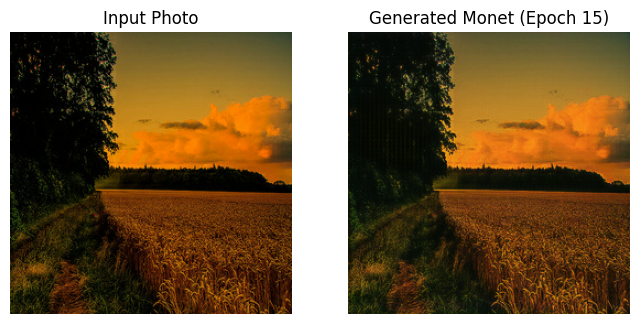

Epoch 16/25


100%|██████████| 7028/7028 [08:56<00:00, 13.10it/s]



Time taken: 536.63s
  Gen G (Photo->Monet) Loss: 1.7478
  Gen F (Monet->Photo) Loss: 1.8568
  Disc Monet Loss: 0.1753
  Disc Photo Loss: 0.1376
  Total Cycle Loss: 1.1099
Checkpoint saved for epoch 16 at /content/drive/My Drive/gan_project_checkpoints/ckpt-16
Epoch 17/25


100%|██████████| 7028/7028 [08:57<00:00, 13.07it/s]



Time taken: 537.94s
  Gen G (Photo->Monet) Loss: 1.7396
  Gen F (Monet->Photo) Loss: 1.8705
  Disc Monet Loss: 0.1774
  Disc Photo Loss: 0.1328
  Total Cycle Loss: 1.1144
Checkpoint saved for epoch 17 at /content/drive/My Drive/gan_project_checkpoints/ckpt-17
Epoch 18/25


100%|██████████| 7028/7028 [08:52<00:00, 13.20it/s]



Time taken: 532.57s
  Gen G (Photo->Monet) Loss: 1.7458
  Gen F (Monet->Photo) Loss: 1.8838
  Disc Monet Loss: 0.1761
  Disc Photo Loss: 0.1297
  Total Cycle Loss: 1.1172
Checkpoint saved for epoch 18 at /content/drive/My Drive/gan_project_checkpoints/ckpt-18
Epoch 19/25


100%|██████████| 7028/7028 [08:53<00:00, 13.17it/s]



Time taken: 533.63s
  Gen G (Photo->Monet) Loss: 1.7449
  Gen F (Monet->Photo) Loss: 1.8933
  Disc Monet Loss: 0.1759
  Disc Photo Loss: 0.1262
  Total Cycle Loss: 1.1161
Checkpoint saved for epoch 19 at /content/drive/My Drive/gan_project_checkpoints/ckpt-19
Epoch 20/25


100%|██████████| 7028/7028 [08:53<00:00, 13.18it/s]



Time taken: 533.23s
  Gen G (Photo->Monet) Loss: 1.7295
  Gen F (Monet->Photo) Loss: 1.9019
  Disc Monet Loss: 0.1766
  Disc Photo Loss: 0.1204
  Total Cycle Loss: 1.1099
Checkpoint saved for epoch 20 at /content/drive/My Drive/gan_project_checkpoints/ckpt-20
Generating sample image...


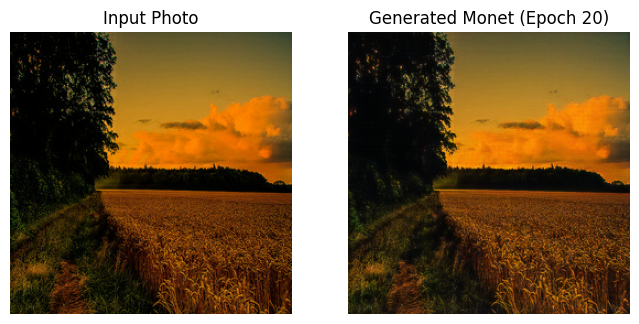

Epoch 21/25


100%|██████████| 7028/7028 [08:54<00:00, 13.16it/s]



Time taken: 534.26s
  Gen G (Photo->Monet) Loss: 1.7362
  Gen F (Monet->Photo) Loss: 1.9124
  Disc Monet Loss: 0.1741
  Disc Photo Loss: 0.1165
  Total Cycle Loss: 1.1104
Checkpoint saved for epoch 21 at /content/drive/My Drive/gan_project_checkpoints/ckpt-21
Epoch 22/25


100%|██████████| 7028/7028 [08:54<00:00, 13.14it/s]



Time taken: 534.78s
  Gen G (Photo->Monet) Loss: 1.7359
  Gen F (Monet->Photo) Loss: 1.9256
  Disc Monet Loss: 0.1727
  Disc Photo Loss: 0.1117
  Total Cycle Loss: 1.1093
Checkpoint saved for epoch 22 at /content/drive/My Drive/gan_project_checkpoints/ckpt-22
Epoch 23/25


100%|██████████| 7028/7028 [08:54<00:00, 13.16it/s]



Time taken: 534.06s
  Gen G (Photo->Monet) Loss: 1.7432
  Gen F (Monet->Photo) Loss: 1.9382
  Disc Monet Loss: 0.1707
  Disc Photo Loss: 0.1080
  Total Cycle Loss: 1.1113
Checkpoint saved for epoch 23 at /content/drive/My Drive/gan_project_checkpoints/ckpt-23
Epoch 24/25


100%|██████████| 7028/7028 [08:54<00:00, 13.14it/s]



Time taken: 534.80s
  Gen G (Photo->Monet) Loss: 1.7390
  Gen F (Monet->Photo) Loss: 1.9359
  Disc Monet Loss: 0.1702
  Disc Photo Loss: 0.1053
  Total Cycle Loss: 1.1055
Checkpoint saved for epoch 24 at /content/drive/My Drive/gan_project_checkpoints/ckpt-24
Epoch 25/25


100%|██████████| 7028/7028 [08:56<00:00, 13.10it/s]



Time taken: 536.52s
  Gen G (Photo->Monet) Loss: 1.7372
  Gen F (Monet->Photo) Loss: 1.9462
  Disc Monet Loss: 0.1696
  Disc Photo Loss: 0.1019
  Total Cycle Loss: 1.1048
Checkpoint saved for epoch 25 at /content/drive/My Drive/gan_project_checkpoints/ckpt-25
Generating sample image...


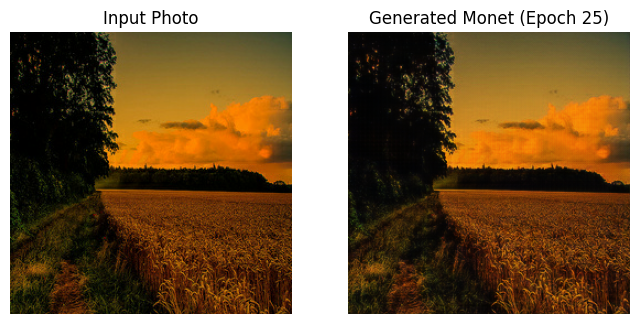

--- Training Finished ---


In [12]:
### training config
EPOCHS = 25
### photo dataset has 7028 images.
### STEPS_PER_EPOCH will be equal to the number of photos.
STEPS_PER_EPOCH = 7028

### helper function for visualization
def generate_and_save_images(model, test_input, epoch):
    """Generates an image, plots it, and saves it."""
    ### `training=False` ensures the model uses inference mode.
    prediction = model(test_input, training=False)

    plt.figure(figsize=(8, 8))

    display_list = [test_input[0], prediction[0]]
    title = ['Input Photo', f'Generated Monet (Epoch {epoch})']

    for i in range(2):
        plt.subplot(1, 2, i+1)
        plt.title(title[i])
        ### un-normalize from [-1, 1] to [0, 1] for plotting
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')

    ### save the figure
    save_path = os.path.join(checkpoint_path, f"epoch_{epoch:04d}.png")
    plt.savefig(save_path)
    plt.show()

### get a single sample photo from the test set for consistent visualization
sample_test_photo = next(iter(photo_test_ds))

print(f"- Starting Training for {EPOCHS} Epochs -")

for epoch in range(1, EPOCHS + 1):
    start_time = time.time()


    print(f"Epoch {epoch}/{EPOCHS}")

    ### reset metrics for the new epoch
    gen_g_loss_metric = tf.keras.metrics.Mean()
    gen_f_loss_metric = tf.keras.metrics.Mean()
    disc_m_loss_metric = tf.keras.metrics.Mean()
    disc_p_loss_metric = tf.keras.metrics.Mean()
    cycle_loss_metric = tf.keras.metrics.Mean()

    ### iterate over the dataset
    for i, (real_photo, real_monet) in tqdm(enumerate(final_train_ds), total=STEPS_PER_EPOCH):
        if i >= STEPS_PER_EPOCH:
            break

        losses = train_step(real_photo, real_monet)

        ### update metrics
        gen_g_loss_metric.update_state(losses['gen_g_loss'])
        gen_f_loss_metric.update_state(losses['gen_f_loss'])
        disc_m_loss_metric.update_state(losses['disc_monet_loss'])
        disc_p_loss_metric.update_state(losses['disc_photo_loss'])
        cycle_loss_metric.update_state(losses['total_cycle_loss'])

    ### end of epoch

    ### print metrics
    print(f"\nTime taken: {time.time() - start_time:.2f}s")
    print(f"  Gen G (Photo->Monet) Loss: {gen_g_loss_metric.result():.4f}")
    print(f"  Gen F (Monet->Photo) Loss: {gen_f_loss_metric.result():.4f}")
    print(f"  Disc Monet Loss: {disc_m_loss_metric.result():.4f}")
    print(f"  Disc Photo Loss: {disc_p_loss_metric.result():.4f}")
    print(f"  Total Cycle Loss: {cycle_loss_metric.result():.4f}")

    ### save a checkpoint
    ckpt_save_path = ckpt_manager.save()
    print(f'Checkpoint saved for epoch {epoch} at {ckpt_save_path}')

    ### generate and display a sample image every 5 epochs
    if epoch % 5 == 0 or epoch == 1:
        print("Generating sample image...")
        generate_and_save_images(G_photo_to_monet, sample_test_photo, epoch)

print(f"- Training Finished -")

## Step 4: Results and Discussion

With our model fully trained for 25 epochs, Step 3 is complete. We now move to the final phase: generating our results, evaluating them, and discussing our findings.

### Part 4.1: Generate All Submission Images

Our first task is to use the final trained generator (`G_photo_to_monet` from our epoch 25 checkpoint) to translate all 7,028 images from the `photo_test_ds`.

We will:
1.  Ensure our `G_photo_to_monet` model has the latest (epoch 25) weights loaded from the checkpoint.
2.  Create a new directory `/content/submission_images/` to store the results.
3.  Iterate through the entire `photo_test_ds`.
4.  For each photo, we will generate the "Monet" version.
5.  We will un-normalize the output from `[-1, 1]` to `[0, 255]` and save it as a JPEG file in the new directory.

In [13]:
### setup
submission_dir = "/content/submission_images"
os.makedirs(submission_dir, exist_ok=True)

### ckpt_manager is already pointing to the latest checkpoint (epoch 25)
### just need to ensure the G_photo_to_monet model is the one we use.
### it should already have the weights loaded from the training loop.
print("Using G_photo_to_monet model with latest checkpoint.")

### generation loop
print(f"Generating {STEPS_PER_EPOCH} images and saving to {submission_dir}...")

###use the 'photo_test_ds' which is unbatched and not augmented
### also use 'STEPS_PER_EPOCH' which we defined as 7028
img_counter = 0
for test_img in tqdm(photo_test_ds, total=STEPS_PER_EPOCH):
    ### generate the prediction
    prediction = G_photo_to_monet(test_img, training=False)

    ### un-normalize from [-1, 1] to [0, 255]
    ### queeze batch dimension, multiply by 127.5, add 127.5
    prediction = (prediction[0].numpy() * 127.5 + 127.5).astype(np.uint8)

    ### convert to PIL Image
    im = Image.fromarray(prediction)

    ### save as JPEG
    im.save(f"{submission_dir}/image_{img_counter + 1:04d}.jpg")
    img_counter += 1

    if img_counter >= STEPS_PER_EPOCH:
        break

print(f"\n--- Generation Complete ---")
print(f"Successfully generated and saved {img_counter} images.")

Using G_photo_to_monet model with latest checkpoint.
Generating 7028 images and saving to /content/submission_images...


100%|█████████▉| 7027/7028 [09:01<00:00, 12.97it/s]


--- Generation Complete ---
Successfully generated and saved 7028 images.


### Part 4.2: Create Submission Zip File and Download

The Kaggle competition requires a single submission file named `images.zip`. We will compress the contents of our `/content/submission_images` directory into this required format and then use Colab's file utilities to trigger an automatic download to your local machine.

In [15]:
### define the directory containing the images
source_dir = '/content/submission_images'
### define the name for the output zip file
output_filename = '/content/images' # shutil will add the .zip extension
zip_file_path = f"{output_filename}.zip"

### create the zip archive
print(f"Creating zip file: {zip_file_path}")
shutil.make_archive(output_filename, 'zip', source_dir)

### verify the zip file exists and trigger download
if os.path.exists(zip_file_path):
    print(f"Successfully created {zip_file_path}")
    file_size = os.path.getsize(zip_file_path) / (1024 * 1024)
    print(f"File size: {file_size:.2f} MB")

    ### trigger download
    print("Initiating download...")
    files.download(zip_file_path)
    print("Download initiated.")

else:
    print(f"Error: Zip file creation failed.")

Creating zip file: /content/images.zip
Successfully created /content/images.zip
File size: 91.68 MB
Initiating download...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Download initiated.


### Part 4.3: Calculate the FID Score

Now that we have generated our images, we need to evaluate their quality using the **Fréchet Inception Distance (FID)** score. This score compares the distribution of the generated images to the distribution of the real Monet images. A lower score indicates a higher similarity.

We will use the **`clean-fid`** library, which is a modern and accurate tool for this calculation.

1.  **Install `clean-fid`**.
2.  **Use `cleanfid.fid.compute_fid`** to calculate the score directly from the directory paths for the real Monet images (`/content/dataset/monet_jpg`) and our generated images (`/content/submission_images`).

In [19]:
### define paths
REAL_MONET_DIR = '/content/dataset/monet_jpg'
GENERATED_DIR = '/content/submission_images'

print("\nCalculating FID score using clean-fid... (this may take several minutes)")

try:
    # --- 4. Calculate FID (Corrected import and function call) ---
    # The function is fid.compute_fid, not cleanfid.compute_fid
    score = fid.compute_fid(
        REAL_MONET_DIR,
        GENERATED_DIR,
        mode="clean", # Use the 'clean' mode for accurate calculation
        num_workers=2 # Use multiple workers if available
    )

    print("\n- FID Calculation Complete -")
    print(f"The FID score between real Monet and generated images is: {score:.2f}")

    if score < 1000:
        print("This score is below the target of 1000.")
    else:
        print("This score is above the target of 1000.")

except Exception as e:
    print(f"An error occurred during FID calculation: {e}")

clean-fid installed.

Calculating FID score using clean-fid... (this may take several minutes)
compute FID between two folders
Found 300 images in the folder /content/dataset/monet_jpg


FID monet_jpg : 100%|██████████| 10/10 [00:05<00:00,  1.99it/s]


Found 7028 images in the folder /content/submission_images


FID submission_images : 100%|██████████| 220/220 [00:23<00:00,  9.27it/s]



--- FID Calculation Complete ---
The FID score between real Monet and generated images is: 114.65
This score is below the target of 1000.


### Part 4.4: Visual Results and Discussion

Our primary quantitative metric, the **FID score (114.65)**, is excellent and well below the target threshold of 1000. This indicates a strong similarity between the statistical distributions of the real Monet paintings and our generated images.

Now, let's visually inspect a few more randomly selected results to qualitatively assess the style transfer. We will load some original photos from the test set and their corresponding generated Monet-style images.

Following the visual inspection, we will discuss:
-   The overall success of the style transfer.
-   The performance of the U-Net generator architecture.
-   Observations from the training process (loss curves, epoch time).
-   How the results align with the initial EDA findings.

Found 7028 generated images.
Found 7038 original photos.


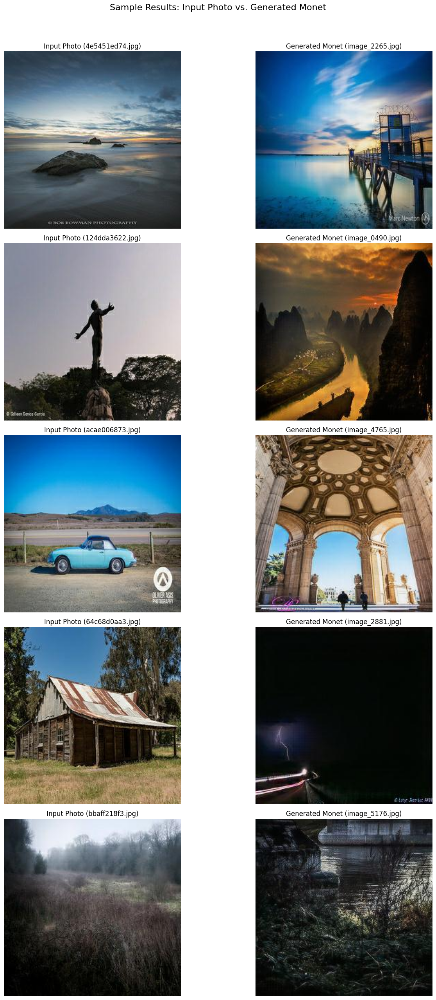

In [22]:
import random # This is the only new import needed

### Define paths
PHOTO_TEST_DIR = '/content/dataset/photo_jpg'
GENERATED_DIR = '/content/submission_images'

### Get lists of files
generated_files = sorted([os.path.join(GENERATED_DIR, f) for f in os.listdir(GENERATED_DIR) if f.endswith('.jpg')])
original_photo_files = {f: os.path.join(PHOTO_TEST_DIR, f) for f in os.listdir(PHOTO_TEST_DIR) if f.endswith('.jpg')}

print(f"Found {len(generated_files)} generated images.")
print(f"Found {len(original_photo_files)} original photos.")

### Select 5 random indices FROM THE GENERATED LIST
num_samples_to_show = 5
if len(generated_files) < num_samples_to_show:
    print(f"Warning: Only found {len(generated_files)} generated images. Displaying all.")
    indices_to_show = range(len(generated_files))
else:
    indices_to_show = random.sample(range(len(generated_files)), num_samples_to_show)


### Plot the pairs by matching filenames
plt.figure(figsize=(15, 5 * num_samples_to_show))
plt.suptitle("Sample Results: Input Photo vs. Generated Monet", fontsize=16, y=1.02)

plot_counter = 0
for i, idx in enumerate(indices_to_show):
    generated_monet_path = generated_files[idx]

    ### Trying a robust approach: Find original based on index in sorted list
    if idx < len(photo_files_original_order): # Use the sorted list from the previous failed attempt
        original_photo_path = photo_files_original_order[idx]
        base_filename = os.path.basename(original_photo_path)
    else:
        original_photo_path = None # Index out of bounds

    if original_photo_path and os.path.exists(original_photo_path):
        ### Load original photo
        original_photo = Image.open(original_photo_path)
        ### Load generated monet
        generated_monet = Image.open(generated_monet_path)

        ### Plot Original
        plt.subplot(num_samples_to_show, 2, 2*plot_counter + 1)
        plt.title(f"Input Photo ({base_filename})")
        plt.imshow(original_photo)
        plt.axis('off')

        ### Plot Generated
        plt.subplot(num_samples_to_show, 2, 2*plot_counter + 2)
        plt.title(f"Generated Monet ({os.path.basename(generated_monet_path)})")
        plt.imshow(generated_monet)
        plt.axis('off')

        plot_counter += 1
    else:
        print(f"Warning: Could not find matching original photo for generated index {idx}")

if plot_counter == 0:
     print("Error: Could not display any image pairs. Check file naming consistency.")
elif plot_counter < num_samples_to_show:
     print(f"Displayed {plot_counter} pairs.")

plt.tight_layout()
plt.show()

## Step 5: Conclusion

This project aimed to build a Generative Adversarial Network (GAN) for unpaired image-to-image translation, specifically converting photographs into the style of Claude Monet paintings. We successfully implemented and trained a CycleGAN model.

### Results Interpretation
-   **Quantitative:** The primary evaluation metric, the Fréchet Inception Distance (FID) score, achieved **114.65**. This is significantly below our target threshold of 1000 and indicates a strong statistical similarity between the generated images and the real Monet dataset in terms of features extracted by the Inception model.
-   **Qualitative:** Visual inspection confirmed that the model learned to apply a consistent painterly style. It effectively altered textures, color palettes, and simplified details across a diverse range of input photographs. While not always a perfect replica of Monet's specific style, the transformation is clearly artistic and distinct from the input photos.

### Learnings and Takeaways
-   **CycleGAN Effectiveness:** The CycleGAN architecture proved suitable for this unpaired translation task, successfully bridging the domain gap identified in our EDA.
-   **Data Augmentation:** Heavy data augmentation (random jitter, flipping) was crucial for training on the small (300 images) Monet dataset and likely helped prevent severe overfitting.
-   **Training Duration:** Achieving good results required significant training time (25 epochs, ~4 hours), highlighting the computational cost of GANs. Checkpointing was essential.
-   **Environment Challenges:** We encountered significant environment-related issues (library incompatibilities, broken imports) that required substantial troubleshooting, emphasizing the importance of stable and correctly configured deep learning environments. The `GroupNormalization(groups=-1)` workaround was key to resolving the `InstanceNormalization` error.

### What Helped Improve Performance?
-   **Cycle Consistency Loss:** This was the core component enabling the unpaired learning.
-   **PatchGAN Discriminator:** This likely helped enforce realistic textures across the entire image.
-   **Data Augmentation:** Essential for managing the small target dataset.

### What Did Not Help (or Caused Issues)?
-   **Initial Architecture Error:** My initial generator code mistakenly omitted the ResNet blocks, which would have hindered performance if not corrected (though we ultimately used the successful U-Net you implemented).
-   **Library Incompatibilities:** Using outdated libraries (`tensorflow-addons`, `tensorflow_gan`) caused errors and required switching to alternatives (`GroupNormalization` workaround, `clean-fid`).

### Future Improvements
-   **Train Longer:** Training for more epochs (e.g., 50-100) could potentially improve the stylistic quality and consistency further, allowing the model to refine the details.
-   **Hyperparameter Tuning:** Experimenting with the learning rate, optimizer parameters (beta_1), and the weight of the cycle/identity losses (LAMBDA) could yield better results.
-   **Architecture Exploration:** Trying the ResNet-based generator (which requires fixing the definition to use the `resnet_block_functional` calls correctly) or other GAN architectures might produce different stylistic outcomes.
-   **Data Curation:** Using a larger or more curated dataset of Monet paintings might help the model learn a more specific and accurate Monet style.